# 2010 US Census data - Population Density 

The 2010 Census collected a variety of demographic information for all the more than 300 million people in the USA.  Here we'll focus on the subset of the data selected by the Cooper Center. Each data point corresponds to a specific person counted in the census servey. Here we will be using the `datashader`library. 

## Load data and set up

Let's load this data into a `Dask` dataframe ( similar to Pandas but better suited for large datasets and distributed operation. 

In [98]:
import datashader as ds
import datashader.transfer_functions as tf
import dask.dataframe as dd
import numpy as np
import pandas as pd

In [99]:
%%time
df = dd.io.parquet.read_parquet('census2010.parq')
df = df.persist()

CPU times: user 36.7 s, sys: 19.7 s, total: 56.4 s
Wall time: 41.7 s


In [100]:
df.head()

,easting,northing,race
0,-12418767.0,3697425.00,h
1,-12418512.0,3697143.50,h
2,-12418245.0,3697584.50,h
3,-12417703.0,3697636.75,w
4,-12418120.0,3697129.25,h


In [101]:
len(df)

306675004

In [188]:
df = df.rename(columns={"race": "ethnicity"})

* There are 306675004 rows in the dataframe (one per person counted in the census)
* Each row has:
    * a location in **Web Mercator format** 
    * an **ethnicity** (where 'w': white, 'b': black, 'a': Asian, 'h': Hispanic, and 'o': other (typically Native American))

## Define some geographic ranges to look at later, and also a default plot size.

In [103]:
USA           = ((-124.72,  -66.95), (23.55, 50.06))
LakeMichigan  = (( -91.68,  -83.97), (40.75, 44.08))
Chicago       = (( -88.29,  -87.30), (41.57, 42.00))
Chinatown     = (( -87.67,  -87.63), (41.84, 41.86))
NewYorkCity   = (( -74.39,  -73.44), (40.51, 40.91))
LosAngeles    = ((-118.53, -117.81), (33.63, 33.96))
Houston       = (( -96.05,  -94.68), (29.45, 30.11))
Austin        = (( -97.91,  -97.52), (30.17, 30.37))
NewOrleans    = (( -90.37,  -89.89), (29.82, 30.05))
Atlanta       = (( -84.88,  -84.04), (33.45, 33.84))

# Convert (longitude, latitude) into Web Mercator coordinates (meters East of Greenwich and meters North of the Equator)
from datashader.utils import lnglat_to_meters as webm
x_range,y_range = [list(r) for r in webm(*USA)]

# Plot width can be adjusted depending on display/monitor size
plot_width  = int(1100)
plot_height = int(plot_width*7.0/12)

Import some utility functions and colormaps, set the background colour of plots, and make the page as big as possible

In [104]:
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9
from colorcet import fire
from IPython.display import HTML, display

# Black background show bright colours better (imo)
background = "black"

export = partial(export_image, background=background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

# Maximise with of the page - it this case it allows for the 1100-pixel plot_width to fit nicely in line
display(HTML("<style>.container { width:100% !important; }</style>"))

## Population density

For our first examples let's focus on population density alone, and ignore the ethnicity data. We'll first create an empty `canvas`'or grid) onto which we'll map our data -  to do so we use the coordinates of continental USA (which will serve as the boundary) and the `plot_width`and `plot_height` defined above). We then map the data points onto the canvas (with the default `count`aggregate). Each pixel will be associate with the data point count in the area it represents, allowing for the population density accross the US to be assessed.

In [105]:
%%time
canvas = ds.Canvas(plot_width, plot_height, *webm(*USA))
agg = canvas.points(df, 'easting', 'northing')

CPU times: user 2.86 s, sys: 3.09 s, total: 5.96 s
Wall time: 3.47 s


To compute this aggregate grid datashader has to iterate through the entire dataset, with hundreds of millions of points.  Once the `agg` array has been computed, subsequent processing will be almost instantaneous, because there are far fewer pixels on a screen than points in the original database.

Let's use the `export` function we predefined above and plot the aggregate grid linearly using the grey-scale colormap:

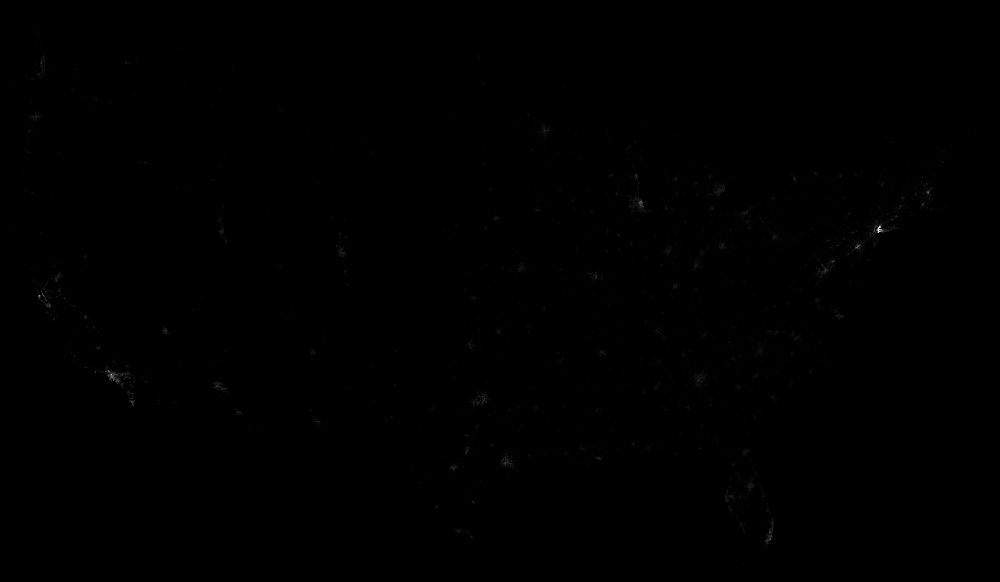

In [106]:
export(tf.shade(agg, cmap=cm(Greys9), how='linear'),"census_gray_linear")

For feeding 300 million points in, we're getting almost nothing back in terms of visualization except a few very dime hotspots.

In the plot above, there is no way to distinguish between pixels that are part of the background and those that have a very low count because both are mapped to black (or nearly black) on a linear scale.  

By discarding the first 25% of the gray colormap, and linearly interpolate the population densities over the remaining range the background can be seperated from the values we are interested in:

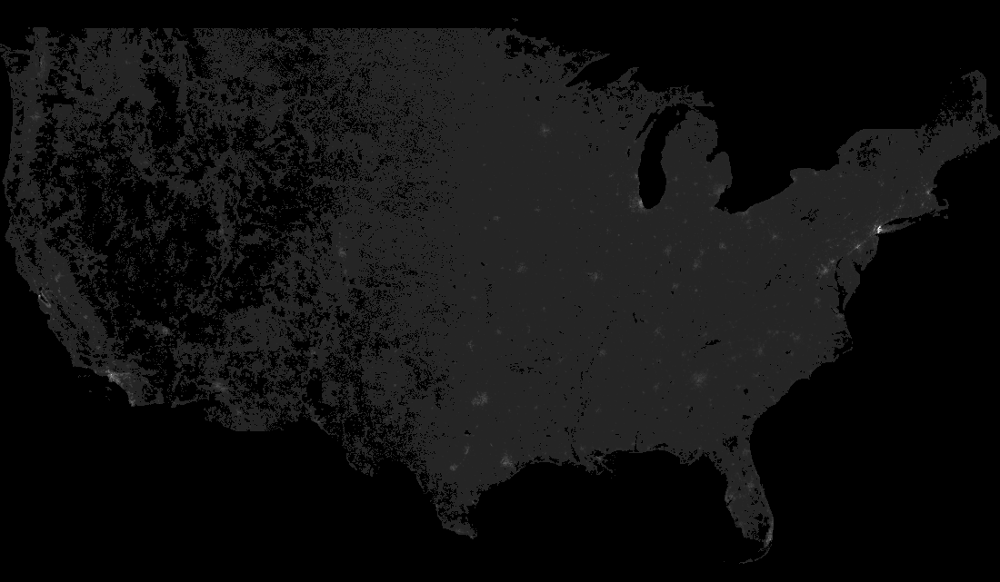

In [107]:
export(tf.shade(agg, cmap = cm(Greys9,0.2), how='linear'),"census_gray_linear")

 * By seperating the background from the data points the shape of the US is revealed. 
 * Many areas in the West are so poorly populated that many pixels contained not even a single person (In datashader images, the background color is shown for pixels that have no data at all, while the colormap range is shown for pixels that do have data).
 * Some additional population centers are now visible. But very little variation is visible, that's because of the linear shading used on an apparently highly non-uniformly distrubituted dataset. (this is actually not a suprise considering the scale and geography of the US)


Let's instead try a nonlinear mapping from population counts into the colormap. A logarithmic mapping is often a good choice:

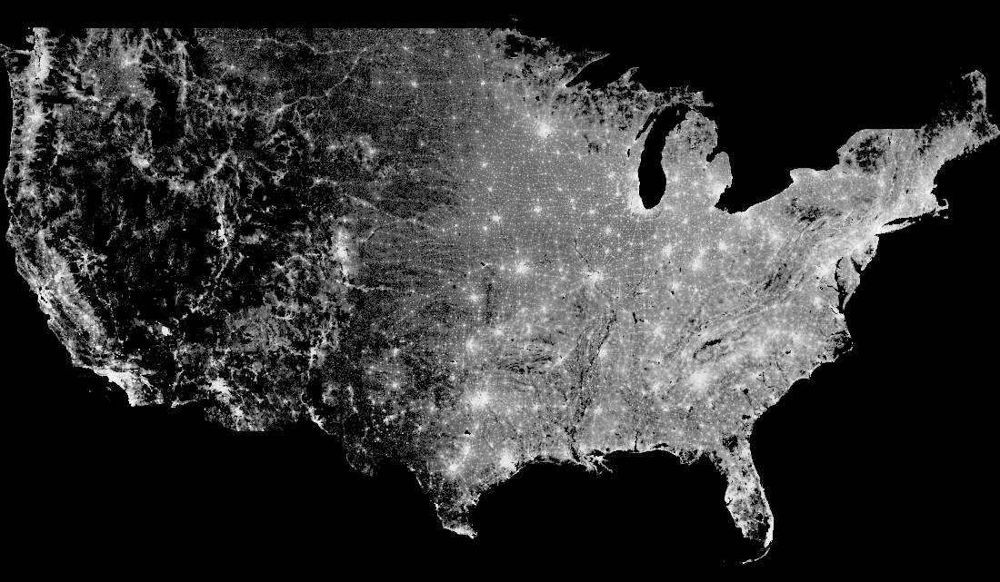

In [108]:
export(tf.shade(agg, cmap=cm(Greys9,0.2), how='log'),"census_gray_log")

Structures and patterns are revealed! 

* Major cities
* Dense urban and coastal areas 
* Roads, and intersections likely locations of smaller towns
* Populated (and inversely) mountainous areas

Clearly, we can now see much more of what's going on in this dataset, thanks to the logarithmic mapping.  Worryingly, though, the choice of `'log'` was purely arbitrary, basically just a hunch based on how many datasets behave.  One could easily imagine that other nonlinear functions would show other interesting patterns, or that different functions would be needed for different datasets.  

The main effect of the `'log'` transform has been to reveal *local* patterns at all population densities -- small towns show up clearly even if they are just slightly more dense than their immediate, rural neighbors, yet large cities with high population density also show up well against the surrounding suburban regions, even if those regions are more dense than the small towns on an absolute scale.

However, the choice of `'log'` was purely arbitrary and an educated guess knowing what the data represents beforehand. Another option is the image-processing technique called histogram equalization: where a set of raw counts is mapped into bins of equal counts, with a bin for every available color in the color map. The result is similar to that from the log transform, but is now non-parametric -- it will equalize any linearly or nonlinearly distributed data, regardless of the distribution:

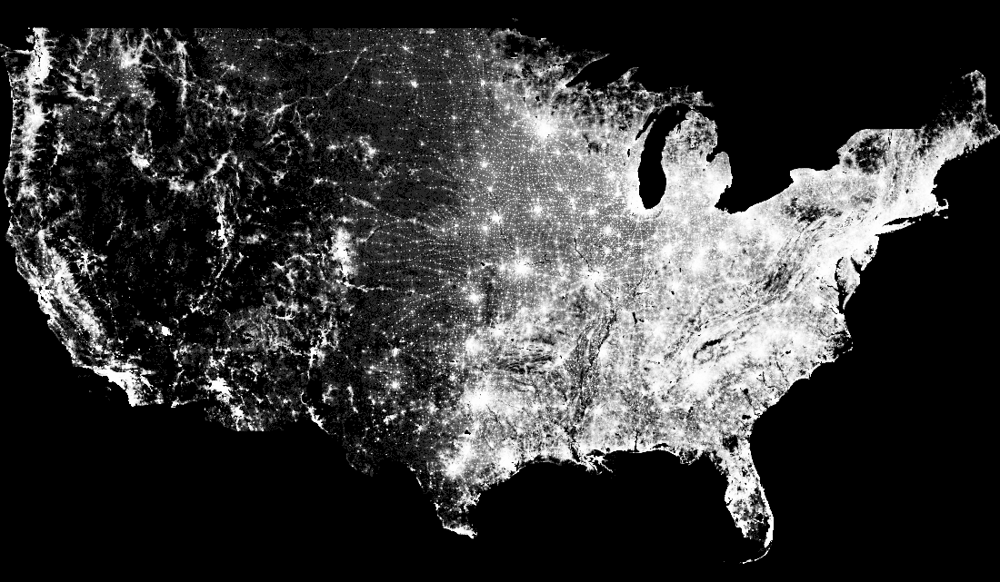

In [109]:
export(tf.shade(agg, cmap=cm(Greys9,0.2), how='eq_hist'),"census_gray_eq_hist")

**Note**: *Given the very different results from the different types of plot, a good practice when visualizing any dataset with datashader is to look at both the linear and the histogram-equalized versions of the data; the linear version preserves the magnitudes, but obscures the distribution, while the histogram-equalized version reveals the distribution while preserving only the order of the magnitudes, not their actual values.  If both plots are similar, then the data is distributed nearly uniformly across the interval.  But much more commonly, the distribution will be highly nonlinear, and the linear plot will reveal only the envelope of the data, i.e., the lowest and the highest values.  In such cases, the histogram-equalized plot will reveal much more of the structure of the data, because it maps the local patterns in the data into perceptible color differences on the screen.*

By using the colors of the display a higher dynamic range can be reached (making sure to use a perceptually uniform colormap - [ref](https://arxiv.org/pdf/1509.03700v1.pdf)). Example below uses the "fire" colormap from the package:

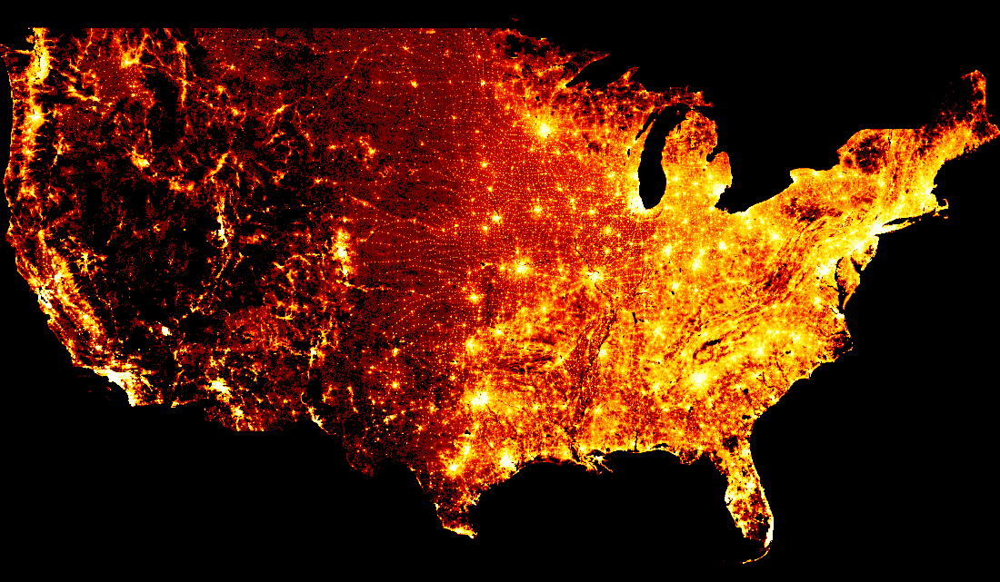

In [110]:
export(tf.shade(agg, cmap=cm(fire,0.2), how='eq_hist'),"census_ds_fire_eq_hist")

Other perceptually uniform color maps that can be found within datashader: `viridis` and `inferno`.

In [111]:
from datashader.colors import viridis, inferno
#export(tf.shade(agg, cmap=cm(inferno,0.1), how='eq_hist'),"census_viridis_eq_hist")

Another way to use colormaps is to utalise the fact that the data is uniformly distributed across the visible colormap when applying histogram equalization. Therefore, the top 5% of pixels (by population density in this case) can be highlighted if we use a colormap divided into 100 ranges, and just change the top 5% to a different color:

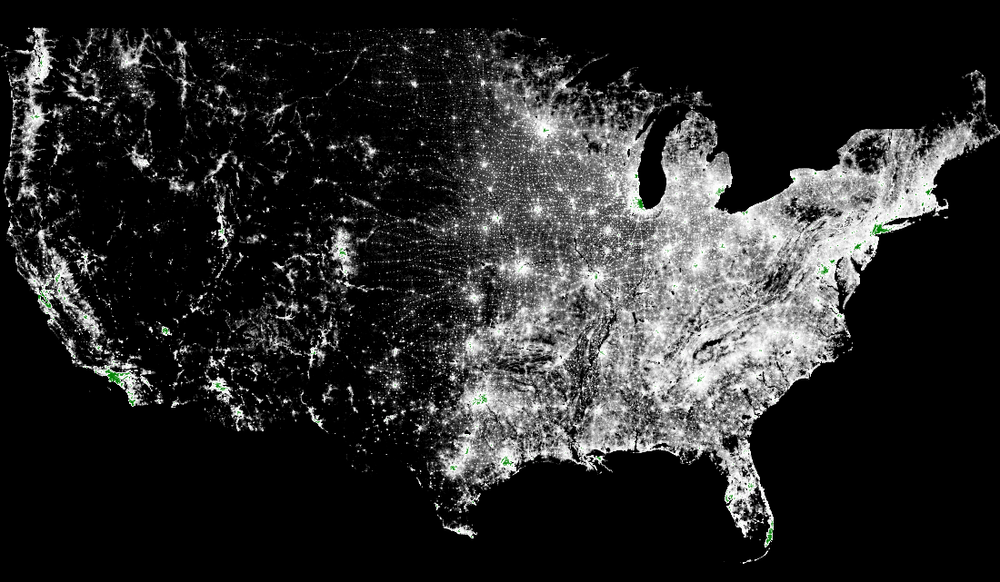

In [112]:
grays2 = cm([(i,i,i) for i in np.linspace(0,255,95)])
grays2 += ["green"]
export(tf.shade(agg, cmap=grays2, how='eq_hist'),"census_gray_redhot1_eq_hist")

The plot above conveys the information available in the linear plot, i.e. that only a few pixels have the very highest population densities, while also conveying the structure of the data at all population density ranges via histogram equalization.

## Interactive HoloViews+Bokeh plots overlaid with map data

The above plots all show static images on their own.  datashader is independent of Bokeh, HoloViews, or other visualization libraries, but when combined with HoloViews and Bokeh, it is easy to make interactive plots that incorporate maps, satellite imagery, annotations, legends, and hover-tool information.

To do this, let's import what we need and set some defaults:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
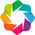

In [223]:
import holoviews as hv, geoviews as gv, geoviews.tile_sources as gts
from holoviews.operation.datashader import datashade, dynspread
from holoviews import opts
hv.extension('bokeh')

opts.defaults(opts.Overlay(width=900, height=525, xaxis=None, yaxis=None))

And then create an interactive plot using a dynamic wrapper datashade that calls datashader whenever someone zooms or pans the plot. In this pipeline, we'll use the tf.dynspread function to automatically increase the plotted size of each datapoint, once you've zoomed in so far that datapoints no longer have nearby neighbors. We'll also add some image tiles in the background, using satellite-derived maps:

In [228]:
population = dynspread(datashade(points, cmap=fire, element_type=gv.Image))
gts.EsriImagery() * population * gts.StamenLabels().options(level="annotation")

:DynamicMap   []
   :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .RGB.I   :RGB   [easting,northing]   (R,G,B,A)
      .WMTS.II :WMTS   [Longitude,Latitude]